MACHINE LEARNING : Cross Validation (KNN, DT & RF algorithm's )
Breast cancer data includes 569 observations of cancer biopsies, each with 32 characteristics (variables).
One feature is an identification number (ID), another is a cancer diagnosis, and 30 are numerical
laboratory measurements. The diagnosis is coded as "M" to indicate malignant or "B" for indicate benign.


Your Exercise deliverable should be : Original dataset to be used + 1 Jupyter Notebook
Submit a zip file with both on your course website.


You were hired to develop a classification algorithm to
predict the diagnostic. Your goal is to apply cross-validation
first to identify the better algorithm (accuracy) to be used
(at least consider Decision Trees, Random Forest and KNN).
After the identification you should develop a strategy to
improve the accuracy based on hypermeters to achieve
the best % of accuracy.

***Solution ***

For the problem to be solved, I will now proceed to import some python librlibraries. Pandas will be used for data structures and analysis. NumPy will be used for computing with array objects. SciKit-learn for processing and predictions. Matplotlib will be used for plotting and Seaborn will be used for visualization.

In [ ]:
#importing phyton liblibraries 

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sns

In [ ]:
#importing dataset and printing the head

crossvalidation_df=pd.read_csv("Cross_validation_dataset.csv")
print(crossvalidation_df.head())

         id diagnosis  ...  symmetry_worst  dimension_worst
0  87139402         B  ...          0.2827          0.06771
1   8910251         B  ...          0.2940          0.07587
2    905520         B  ...          0.2998          0.07881
3    868871         B  ...          0.2102          0.06784
4   9012568         B  ...          0.2487          0.06766

[5 rows x 32 columns]


In [ ]:
crossvalidation_df.shape

(569, 32)

In [ ]:
type(crossvalidation_df)

pandas.core.frame.DataFrame

In [ ]:
!pip install sweetviz
import sweetviz as sv

In [ ]:
crossvalidation_df_report=sv.analyze(crossvalidation_df)

In [ ]:
crossvalidation_df_report.show_html

<bound method DataframeReport.show_html of <sweetviz.dataframe_report.DataframeReport object at 0x7f8aa77ba710>>

**Observation **

The imported data file does not display properly in pandas, The columns will be renamed to fix the problem.

The diagnosis is coded as "M" to indicate malignant or "B" for indicate benign. For the algorithms to understand these diagnosis, "M" which represents malignant will be coded as 1, while "B" which represents benign will be coded as 0.

In [ ]:
# to continue the EDA, a check for missing values is being conducted 

count_nan=crossvalidation_df.isnull().sum()
print(count_nan[count_nan>0])

Series([], dtype: int64)


In [ ]:
crossvalidation_df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'points_mean', 'symmetry_mean', 'dimension_mean', 'radius_se',
       'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'points_se', 'symmetry_se',
       'dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst', 'points_worst', 'symmetry_worst', 'dimension_worst'],
      dtype='object')

In [ ]:
#currently, the column names are too long, which is the reason why some of the values are not showing, I will now go ahead to rename the columns and check if the values will show
crossvalidation_df_newc = crossvalidation_df.rename(columns={'id': 'ID',
                                                  'diagnosis': 'DIAG',
                                                  'radius_mean': 'RM',
                                                  'texture_mean': 'TM',
                                                  'perimeter_mean': 'PM',
                                                  'area_mean': 'AM',
                                                  'smoothness_mean':'SM',
                                                  'compactness_mean':'CM',
                                                  'concavity_mean':'COM',
                                                  'points_mean':'POM',
                                                  'symmetry_mean':'SYM',
                                                  'dimension_mean':'DM',
                                                  'radius_se':'RS',
                                                  'texture_se':'TS',
                                                  'perimeter_se':'PS',
                                                  'area_se':'AS',
                                                  'smoothness_se':'SS',
                                                  'compactness_se':'CS',
                                                  'concavity_se':'COS',
                                                  'points_se':'POS',
                                                  'symmetry_se':'SYS',
                                                  'dimension_se':'DS',
                                                  'radius_worst':'RW',
                                                  'texture_worst':'TW',
                                                  'perimeter_worst':'PW',
                                                  'area_worst':'AW',
                                                  'smoothness_worst':'SW',
                                                  'compactness_worst':'CW',
                                                  'concavity_worst':'COW',
                                                  'points_worst':'POW',
                                                  'symmetry_worst':'SYW',
                                                  'dimension_worst':'DW'})

In [ ]:
crossvalidation_df_newc.columns

Index(['ID', 'DIAG', 'RM', 'TM', 'PM', 'AM', 'SM', 'CM', 'COM', 'POM', 'SYM',
       'DM', 'RS', 'TS', 'PS', 'AS', 'SS', 'CS', 'COS', 'POS', 'SYS', 'DS',
       'RW', 'TW', 'PW', 'AW', 'SW', 'CW', 'COW', 'POW', 'SYW', 'DW'],
      dtype='object')

In [ ]:
crossvalidation_df_newc.head()

,ID,DIAG,RM,TM,PM,AM,SM,CM,COM,POM,SYM,DM,RS,TS,PS,AS,SS,CS,COS,POS,SYS,DS,RW,TW,PW,AW,SW,CW,COW,POW,SYW,DW
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [ ]:
#For the algorithms to understand the diagnosis 'DIAG', "M" which represents malignant will be coded as 1, while "B" which represents benign will be coded as 0.
crossvalidation_df_newc['DIAG']=crossvalidation_df_newc['DIAG'].replace(['B','M'],['0','1'])


In [ ]:
crossvalidation_df_newc

,ID,DIAG,RM,TM,PM,AM,SM,CM,COM,POM,SYM,DM,RS,TS,PS,AS,SS,CS,COS,POS,SYS,DS,RW,TW,PW,AW,SW,CW,COW,POW,SYW,DW
0,87139402,0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,0.2360,0.6656,1.670,17.43,0.008045,0.011800,0.01683,0.012410,0.01924,0.002248,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,0,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,0,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,0,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,0,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,911320502,0,13.17,18.22,84.28,537.3,0.07466,0.05994,0.04859,0.02870,0.1454,0.05549,0.2023,0.6850,1.236,16.89,0.005969,0.014930,0.01564,0.008463,0.01093,0.001672,14.90,23.89,95.10,687.6,0.1282,0.1965,0.18760,0.10450,0.2235,0.06925
565,898677,0,10.26,14.71,66.20,321.6,0.09882,0.09159,0.03581,0.02037,0.1633,0.07005,0.3380,2.5090,2.394,19.33,0.017360,0.046710,0.02611,0.012960,0.03675,0.006758,10.88,19.48,70.89,357.1,0.1360,0.1636,0.07162,0.04074,0.2434,0.08488
566,873885,1,15.28,22.41,98.92,710.6,0.09057,0.10520,0.05375,0.03263,0.1727,0.06317,0.2054,0.4956,1.344,19.53,0.003290,0.013950,0.01774,0.006009,0.01172,0.002575,17.80,28.03,113.80,973.1,0.1301,0.3299,0.36300,0.12260,0.3175,0.09772
567,911201,0,14.53,13.98,93.86,644.2,0.10990,0.09242,0.06895,0.06495,0.1650,0.06121,0.3060,0.7213,2.143,25.70,0.006133,0.012510,0.01615,0.011360,0.02207,0.003563,15.80,16.93,103.10,749.9,0.1347,0.1478,0.13730,0.10690,0.2606,0.07810


**DATA VISUAVISUALIZATION** 


The next step is to visualize the data using graphs

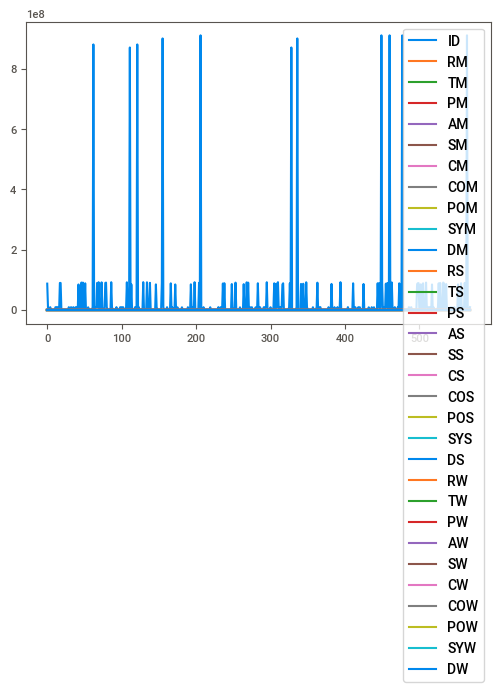

In [ ]:
crossvalidation_df_newc.plot()

In [ ]:
sns.pairplot(crossvalidation_df_newc)

Due to the high number of variables in the dataframe, ploting the histogram and Seaborn pairplot with all the data does not provide much insight as it is difficult to read. I will now proceed to plot graphs for the individual variables with respect to diagnosis 'DIAG' variable.

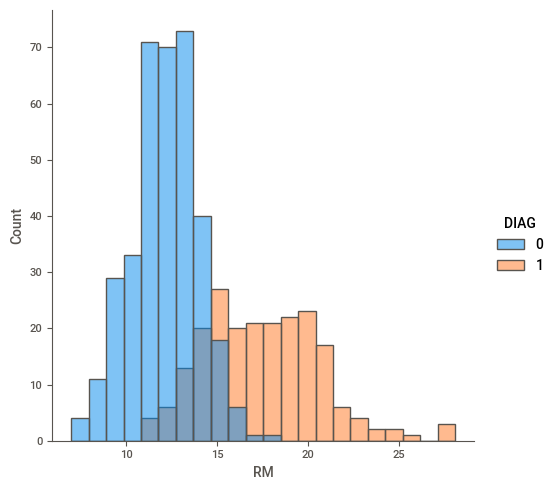

In [ ]:
sns.displot(crossvalidation_df_newc, x="RM", hue="DIAG")

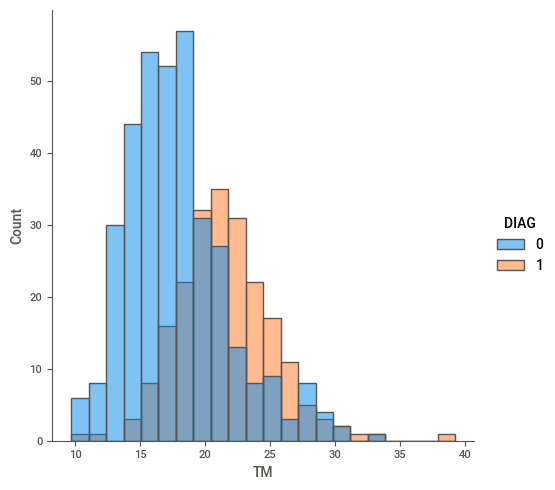

In [ ]:
sns.displot(crossvalidation_df_newc, x="TM", hue="DIAG")

texture_mean': 'TM',

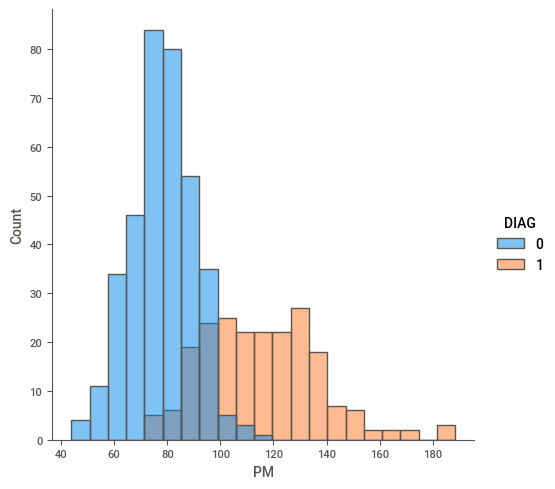

In [ ]:
sns.displot(crossvalidation_df_newc, x="PM", hue="DIAG")
#perimeter_mean': 'PM'

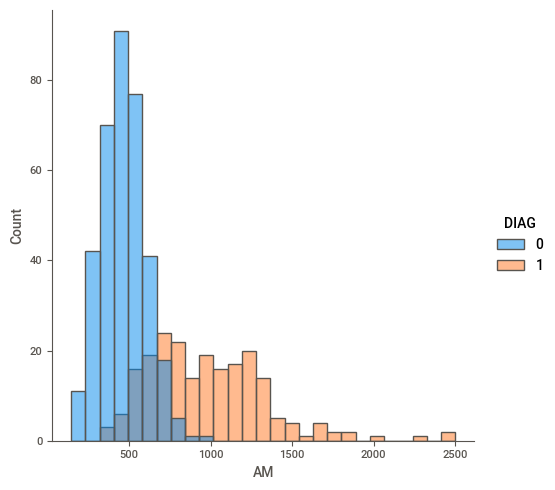

In [ ]:
sns.displot(crossvalidation_df_newc, x="AM", hue="DIAG")
#'area_mean': 'AM',

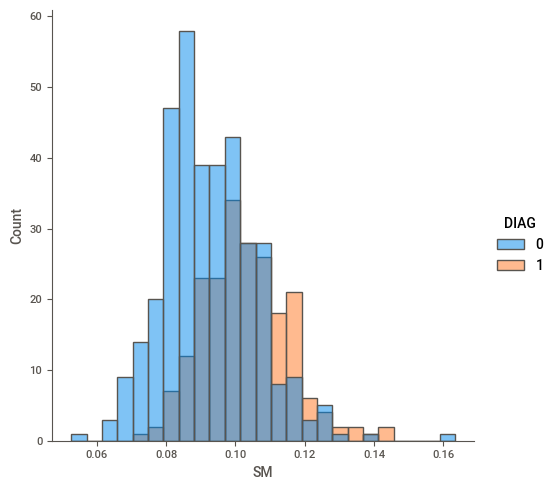

In [ ]:
sns.displot(crossvalidation_df_newc, x="SM", hue="DIAG")
#'smoothness_mean':'SM'

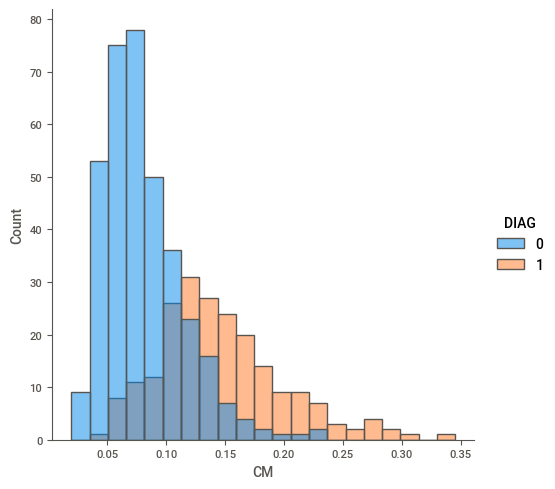

In [ ]:
sns.displot(crossvalidation_df_newc, x="CM", hue="DIAG")
#'compactness_mean':'CM',

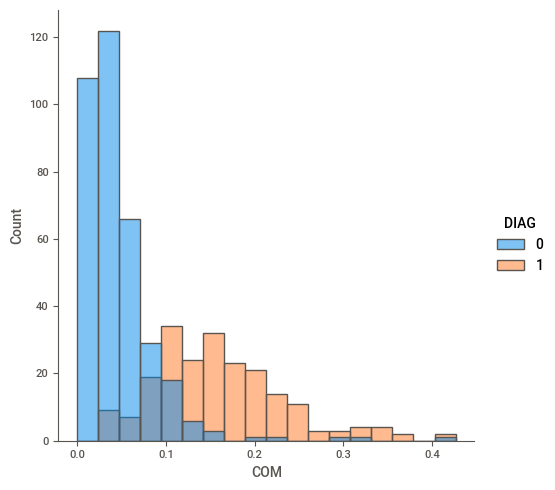

In [ ]:
sns.displot(crossvalidation_df_newc, x="COM", hue="DIAG")
#'concavity_mean':'COM'

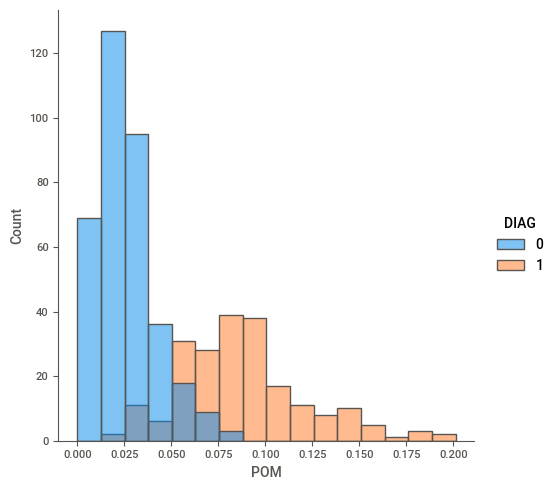

In [ ]:
sns.displot(crossvalidation_df_newc, x="POM", hue="DIAG")
#'points_mean':'POM'

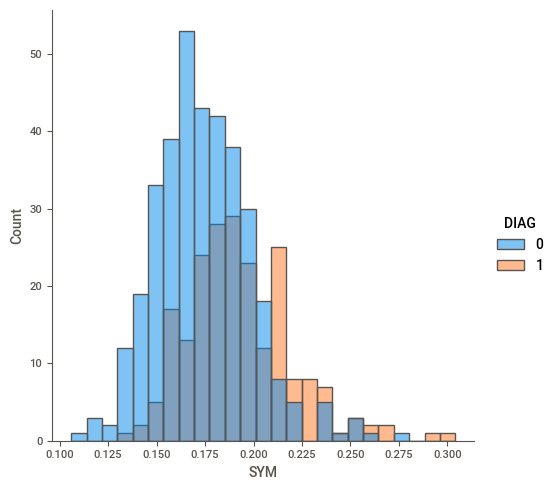

In [ ]:
sns.displot(crossvalidation_df_newc, x="SYM", hue="DIAG")
#'symmetry_mean':'SYM'

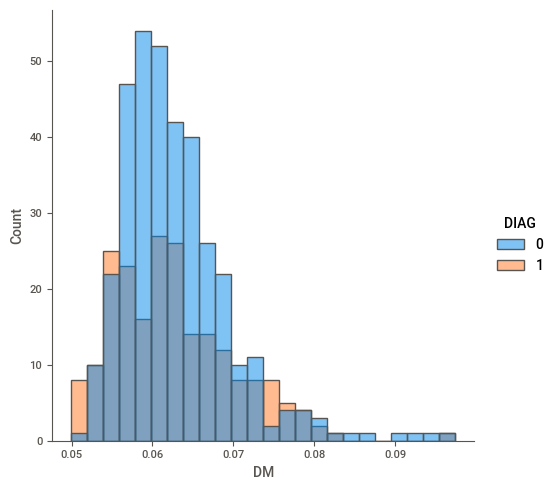

In [ ]:
sns.displot(crossvalidation_df_newc, x="DM", hue="DIAG")
#'dimension_mean':'DM'

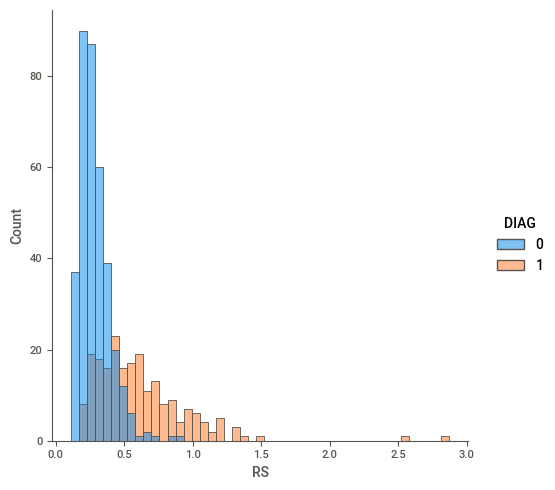

In [ ]:
sns.displot(crossvalidation_df_newc, x="RS", hue="DIAG")
#'radius_se':'RS'

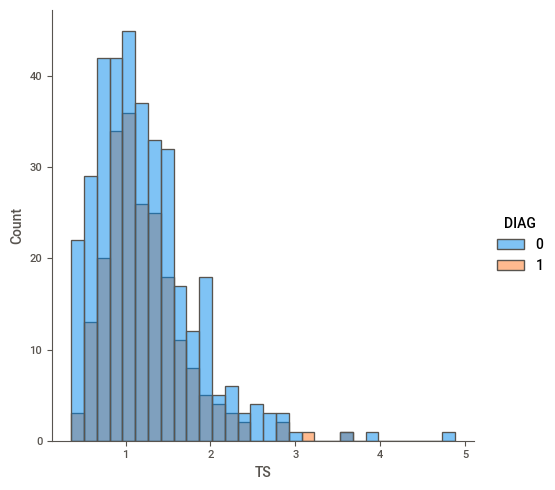

In [ ]:
sns.displot(crossvalidation_df_newc, x="TS", hue="DIAG")
#'texture_se':'TS'

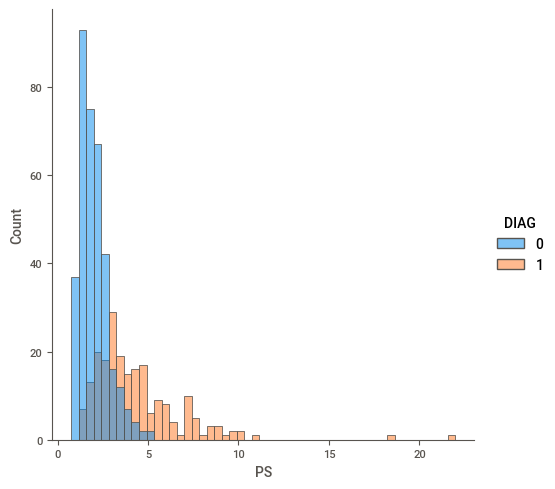

In [ ]:
sns.displot(crossvalidation_df_newc, x="PS", hue="DIAG")
#'perimeter_se':'PS'

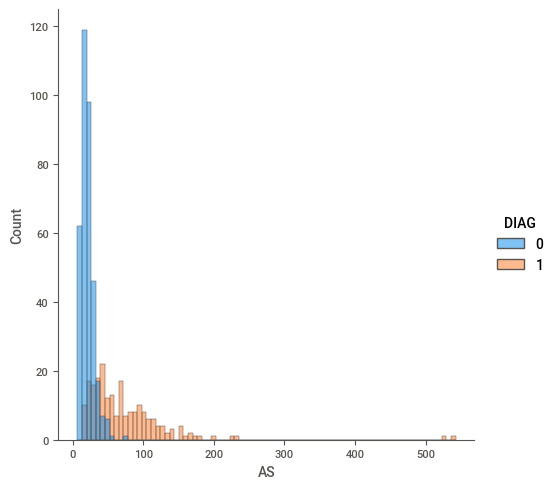

In [ ]:
sns.displot(crossvalidation_df_newc, x="AS", hue="DIAG")
#'area_se':'AS'

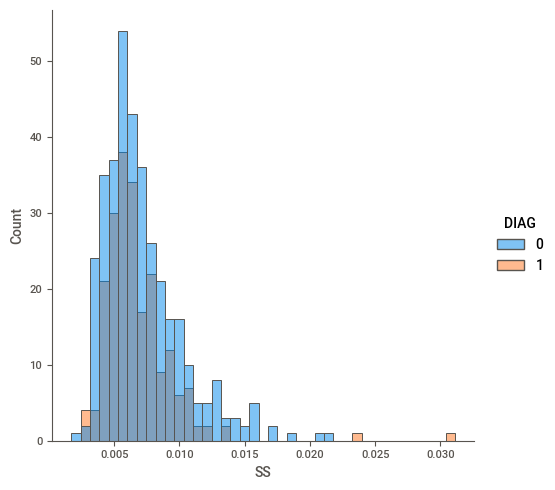

In [ ]:
sns.displot(crossvalidation_df_newc, x="SS", hue="DIAG")
#'smoothness_se':'SS'

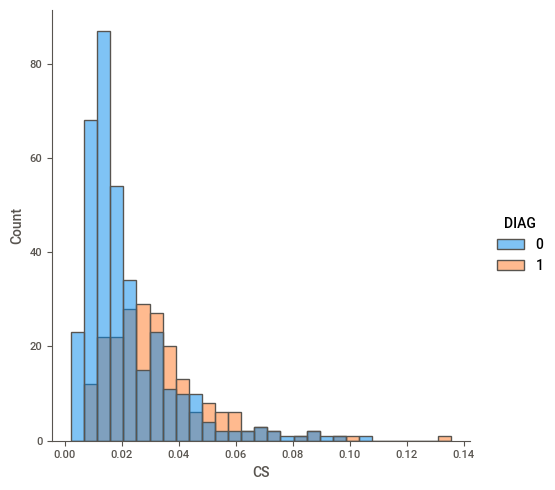

In [ ]:
sns.displot(crossvalidation_df_newc, x="CS", hue="DIAG")
#'compactness_se':'CS'

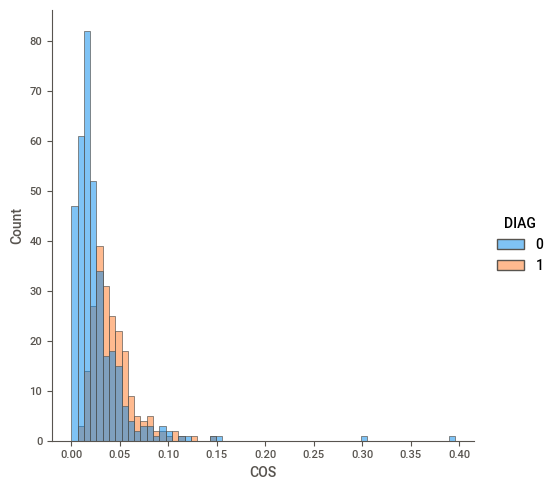

In [ ]:
sns.displot(crossvalidation_df_newc, x="COS", hue="DIAG")
#'concavity_se':'COS'

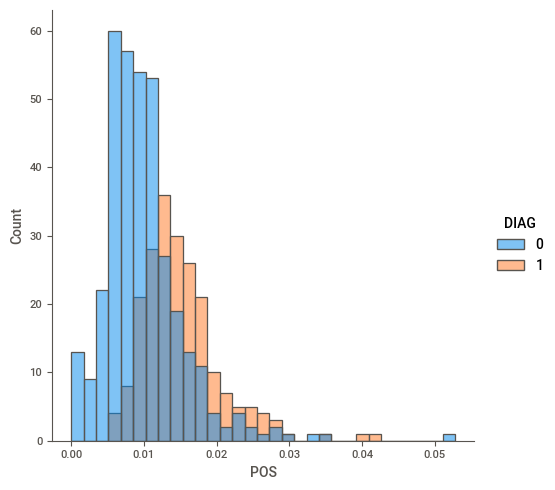

In [ ]:
sns.displot(crossvalidation_df_newc, x="POS", hue="DIAG")
#'points_se':'POS'

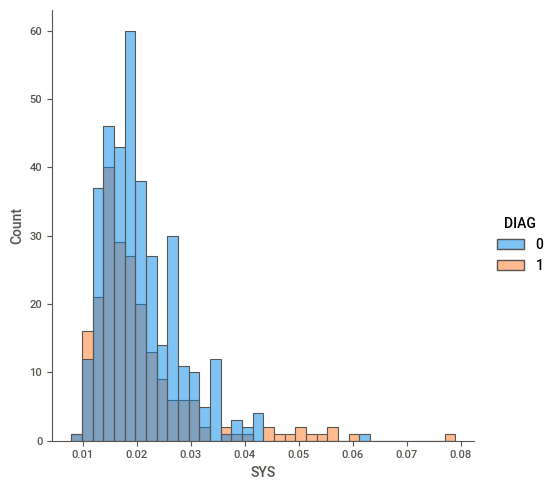

In [ ]:
sns.displot(crossvalidation_df_newc, x="SYS", hue="DIAG")
#'symmetry_se':'SYS'

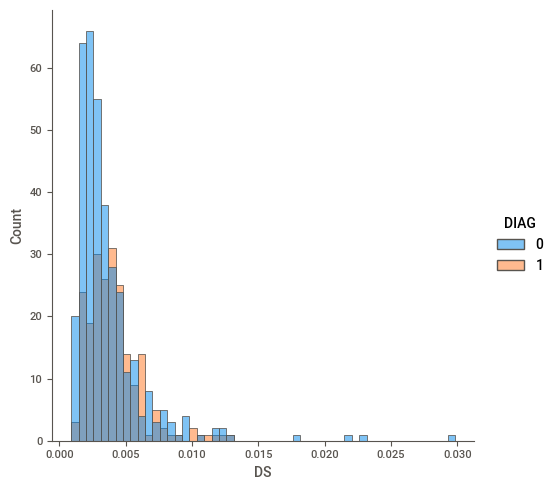

In [ ]:
sns.displot(crossvalidation_df_newc, x="DS", hue="DIAG")
#'dimension_se':'DS'

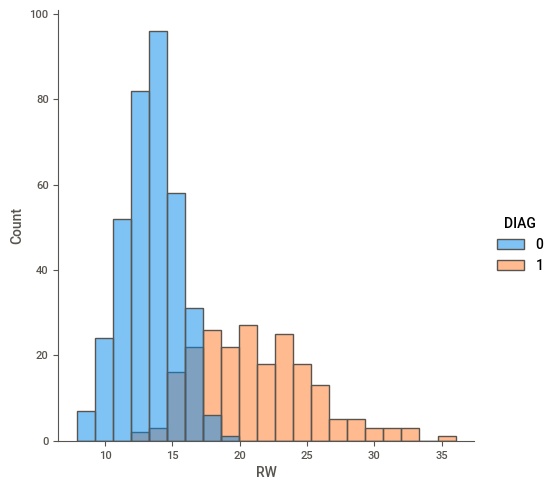

In [ ]:
sns.displot(crossvalidation_df_newc, x="RW", hue="DIAG")
#'radius_worst':'RW'

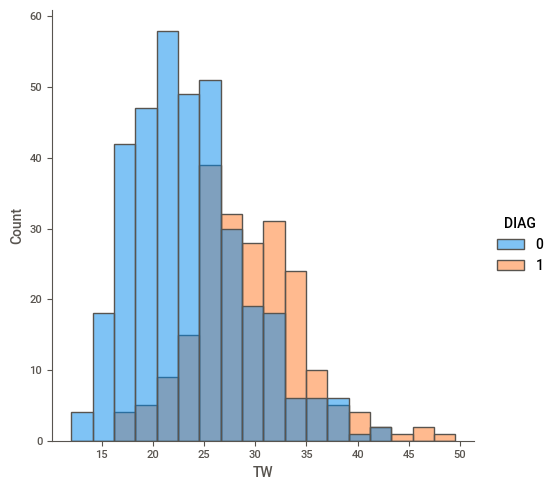

In [ ]:
sns.displot(crossvalidation_df_newc, x="TW", hue="DIAG")
#'texture_worst':'TW'

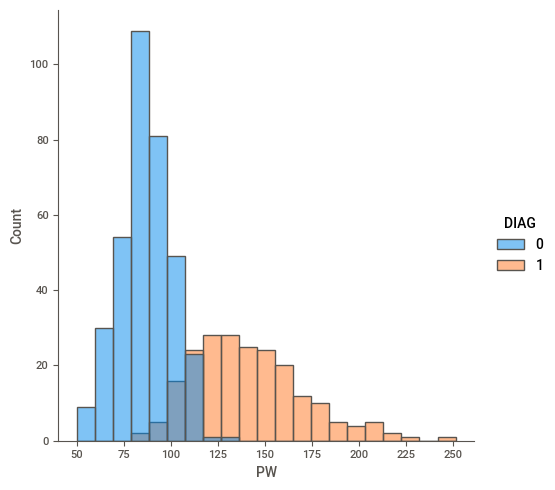

In [ ]:
sns.displot(crossvalidation_df_newc, x="PW", hue="DIAG")
#'perimeter_worst':'PW'

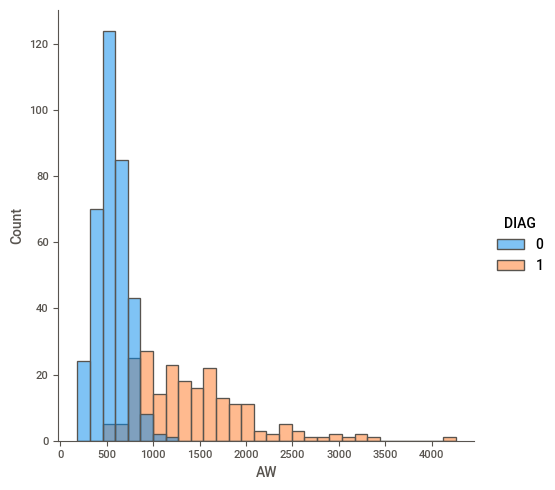

In [ ]:
sns.displot(crossvalidation_df_newc, x="AW", hue="DIAG")
#'area_worst':'AW'

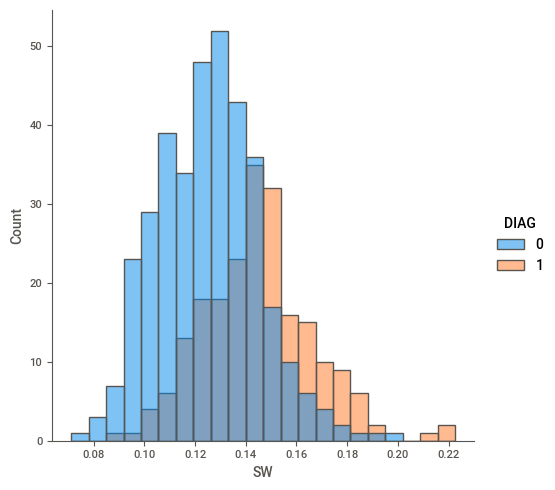

In [ ]:
sns.displot(crossvalidation_df_newc, x="SW", hue="DIAG")
#'smoothness_worst':'SW'

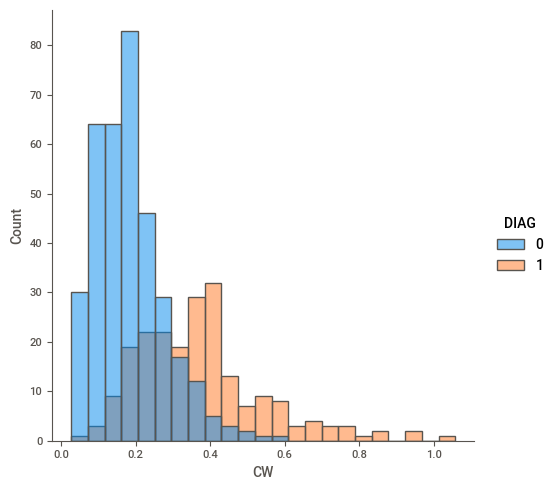

In [ ]:
sns.displot(crossvalidation_df_newc, x="CW", hue="DIAG")
#'compactness_worst':'CW'

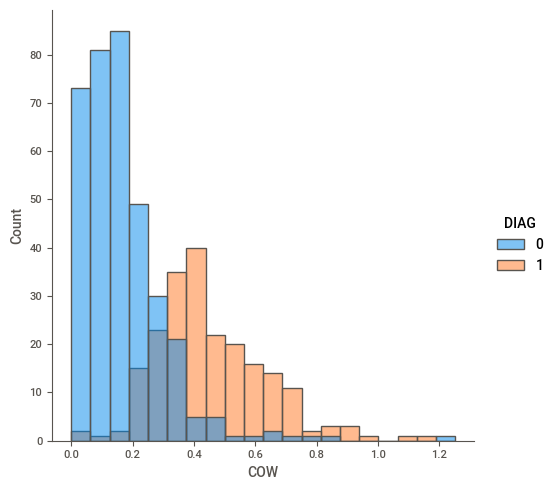

In [ ]:
sns.displot(crossvalidation_df_newc, x="COW", hue="DIAG")
#'concavity_worst':'COW'

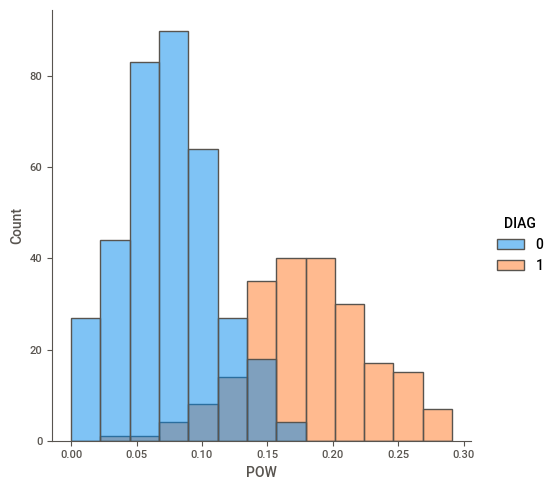

In [ ]:
sns.displot(crossvalidation_df_newc, x="POW", hue="DIAG")
#'points_worst':'POW'

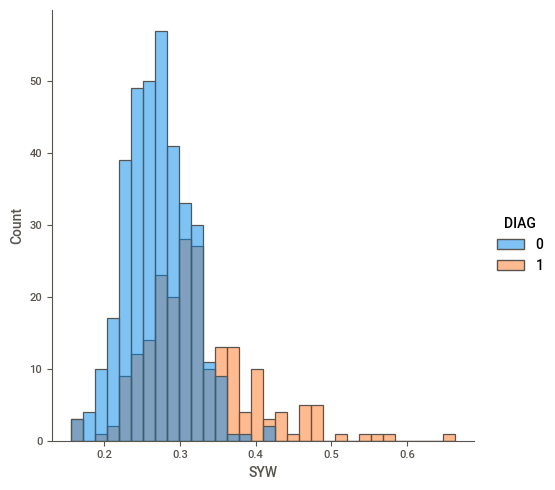

In [ ]:
sns.displot(crossvalidation_df_newc, x="SYW", hue="DIAG")
#'symmetry_worst':'SYW'

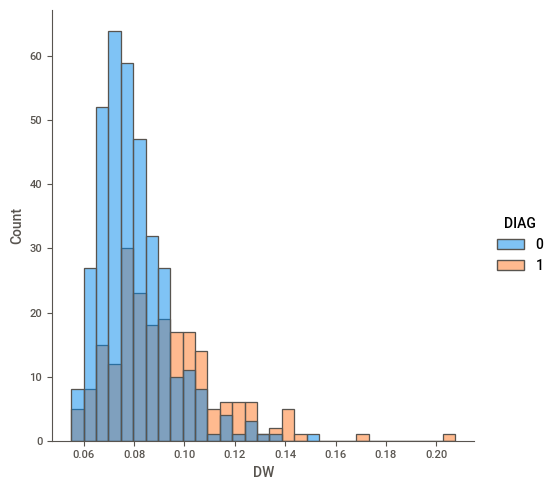

In [ ]:
sns.displot(crossvalidation_df_newc, x="DW", hue="DIAG")
#'dimension_worst':'DW'

The histograms above shows the distribution of the various variables of the data. These histograms are plotted to show the difference in distribution between the diagnosis 'DIAG' of malignant which is coded as 1, and benign which is coded as 0. The histograms also shows that there are a few outliers in the data. These outliers will be resolved in the next phase of analysis.


**Treating Outliers**

The IQR method will be used to identify the outliers. The IQR represents Interquartile Range and it is the distance between the first quartile at 25% and the third quartile at 75%. Any data points that are past the distance are treated as outliers. Due to the sensitivity of the project which is the detection of breast cancer, there is no margin for error, therefor all the identified outliers will be removed and not used for the prediction modeling. 

In [ ]:
#Calculating the the IQR for the dataset
Q1 = crossvalidation_df_newc.quantile(0.25)
Q3 = crossvalidation_df_newc.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

ID     7.943911e+06
RM     4.080000e+00
TM     5.630000e+00
PM     2.893000e+01
AM     3.624000e+02
SM     1.893000e-02
CM     6.548000e-02
COM    1.011400e-01
POM    5.369000e-02
SYM    3.380000e-02
DM     8.420000e-03
RS     2.465000e-01
TS     6.401000e-01
PS     1.751000e+00
AS     2.734000e+01
SS     2.977000e-03
CS     1.937000e-02
COS    2.696000e-02
POS    7.072000e-03
SYS    8.320000e-03
DS     2.310000e-03
RW     5.780000e+00
TW     8.640000e+00
PW     4.129000e+01
AW     5.687000e+02
SW     2.940000e-02
CW     1.919000e-01
COW    2.684000e-01
POW    9.647000e-02
SYW    6.750000e-02
DW     2.062000e-02
dtype: float64


In [ ]:
#printing the dataframe to visualy see the data that are outliers and the data that fall with the normal distribution. False data means that the data falls within the normal range while true means that the data is an outlier.
crossvalidation_df_otd=(crossvalidation_df_newc < (Q1 - 1.5 * IQR)) |(crossvalidation_df_newc > (Q3 + 1.5 * IQR))
print(crossvalidation_df_otd)

        AM     AS     AW     CM    COM  ...    SYS    SYW     TM     TS     TW
0    False  False  False  False  False  ...  False  False  False  False  False
1    False  False  False  False  False  ...  False  False  False  False  False
2    False  False  False  False  False  ...  False  False  False  False  False
3    False  False  False  False  False  ...  False  False  False  False  False
4    False  False  False  False  False  ...  False  False  False  False  False
..     ...    ...    ...    ...    ...  ...    ...    ...    ...    ...    ...
564  False  False  False  False  False  ...  False  False  False  False  False
565  False  False  False  False  False  ...   True  False  False   True  False
566  False  False  False  False  False  ...  False  False  False  False  False
567  False  False  False  False  False  ...  False  False  False  False  False
568   True  False  False  False  False  ...  False  False  False  False  False

[569 rows x 32 columns]


In [ ]:
#deleting the outliers from the original dataframe and naming the new dataframe.
crossvalidation_df_otout = crossvalidation_df_newc[~((crossvalidation_df_newc < (Q1 - 1.5 * IQR)) |(crossvalidation_df_newc > (Q3 + 1.5 * IQR))).any(axis=1)]
crossvalidation_df_otout.shape

(346, 32)

In [ ]:
crossvalidation_df_otout

,ID,DIAG,RM,TM,PM,AM,SM,CM,COM,POM,SYM,DM,RS,TS,PS,AS,SS,CS,COS,POS,SYS,DS,RW,TW,PW,AW,SW,CW,COW,POW,SYW,DW
1,8910251,0,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,0.4505,1.1970,3.430,27.10,0.007470,0.035810,0.03354,0.013650,0.03504,0.003318,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,0,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,0.1967,1.3870,1.342,13.54,0.005158,0.009355,0.01056,0.007483,0.01718,0.002198,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,0,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,0.3384,1.3430,1.851,26.33,0.011270,0.034980,0.02187,0.019650,0.01580,0.003442,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,0,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766
5,906539,0,11.57,19.04,74.20,409.7,0.08546,0.07722,0.05485,0.01428,0.2031,0.06267,0.2864,1.4400,2.206,20.30,0.007278,0.020470,0.04447,0.008799,0.01868,0.003339,13.07,26.98,86.43,520.5,0.1249,0.1937,0.25600,0.06664,0.3035,0.08284
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
560,854268,1,14.25,21.72,93.63,633.0,0.09823,0.10980,0.13190,0.05598,0.1885,0.06125,0.2860,1.0190,2.657,24.91,0.005878,0.029950,0.04815,0.011610,0.02028,0.004022,15.89,30.36,116.20,799.6,0.1446,0.4238,0.51860,0.14470,0.3591,0.10140
562,9113156,0,14.40,26.99,92.25,646.1,0.06995,0.05223,0.03476,0.01737,0.1707,0.05433,0.2315,0.9112,1.727,20.52,0.005356,0.016790,0.01971,0.006370,0.01414,0.001892,15.40,31.98,100.40,734.6,0.1017,0.1460,0.14720,0.05563,0.2345,0.06464
563,894855,0,12.86,13.32,82.82,504.8,0.11340,0.08834,0.03800,0.03400,0.1543,0.06476,0.2212,1.0420,1.614,16.57,0.005910,0.020160,0.01902,0.010110,0.01202,0.003107,14.04,21.08,92.80,599.5,0.1547,0.2231,0.17910,0.11550,0.2382,0.08553
566,873885,1,15.28,22.41,98.92,710.6,0.09057,0.10520,0.05375,0.03263,0.1727,0.06317,0.2054,0.4956,1.344,19.53,0.003290,0.013950,0.01774,0.006009,0.01172,0.002575,17.80,28.03,113.80,973.1,0.1301,0.3299,0.36300,0.12260,0.3175,0.09772


The new dataframe shows 346 valid data that falls within the normal range. We will randomly select variables with outliers in the original dataset for ploting histogram in the new dataset to confirm that the outliers have been removed. 

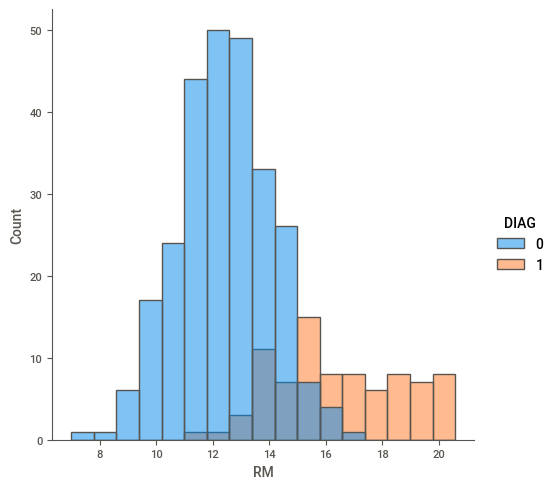

In [ ]:
sns.displot(crossvalidation_df_otout, x="RM", hue="DIAG")

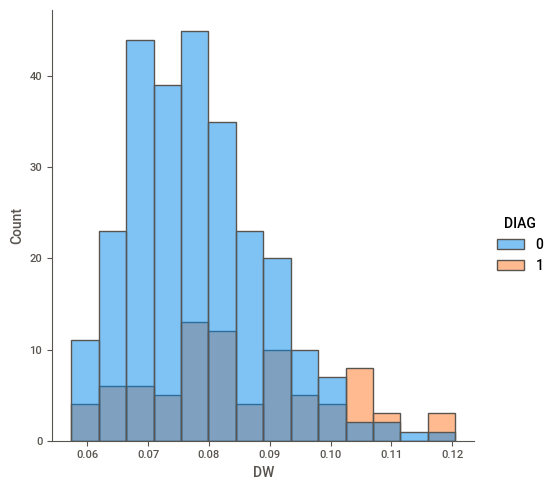

In [ ]:
sns.displot(crossvalidation_df_otout, x="DW", hue="DIAG")

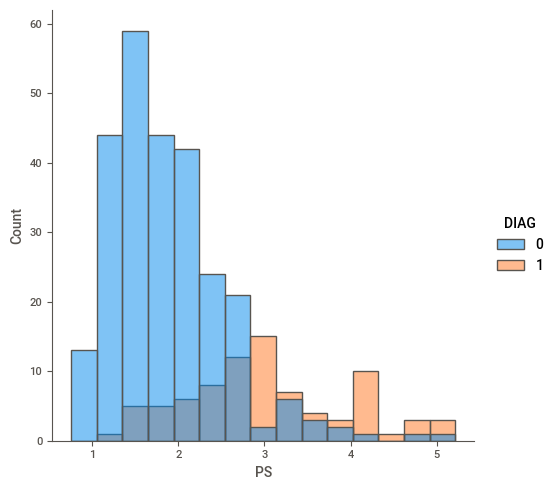

In [ ]:
sns.displot(crossvalidation_df_otout, x="PS", hue="DIAG")

Based on the output of the histograms above, we can now confirm that the new data is free of outliers from the proginal data.

**CROSS VALIDATION AND MODELING **



The next step is to conduct a cross validation to select the best modeling method for the dataset. 
The Kfold method will be used to build the cross validation. The KFold method works by dividing the data into k subsets and the hold out is repeated k times. Each time, one of the subset is used to test while all other subset is used for training. For this project, we will be using 5 KFolds.
The models that would be considered are Random Forest, Decision Trees and K-Nearest Neighbors(KNN). 

In [ ]:
#importing libraries 
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, cross_val_score

In [ ]:
# creating features and target variable

X = crossvalidation_df_otout [['RM','TM', 'PM', 'AM', 'SM', 'CM', 'COM', 'POM', 'SYM', 'DM', 'RS','TS', 'PS', 'AS', 'SS','CS','COS','POS','SYS','DS','RW','TW','PW','AW','SW','CW','COW','POW','SYW','DW']].values
y = crossvalidation_df_otout['DIAG'].values

In [ ]:
#building a random forest classifier using cross validation
rf = RandomForestClassifier(n_jobs=-1)
k_fold = KFold(n_splits=5)
cross_val_score(rf, X, y, cv=k_fold, scoring= 'accuracy', n_jobs=-1)


array([0.87142857, 0.95652174, 0.95652174, 0.94202899, 0.97101449])

In [ ]:
#getting the average score for the random forest cross validation
scores = cross_val_score(rf, X, y, cv=k_fold, scoring= 'accuracy', n_jobs=-1)
ave_scores=np.mean(scores)
print (ave_scores)

0.9394616977225672


In [ ]:
#building a decision tree classifier using cross validation
dt = DecisionTreeClassifier()
k_folddt = KFold(n_splits=5)
cross_val_score(dt, X, y, cv=k_folddt)

array([0.85714286, 0.92753623, 0.86956522, 0.92753623, 0.88405797])

In [ ]:
#getting the average scores for decision tree cross validation
scoresdt = cross_val_score(dt, X, y, cv=k_folddt)
ave_scoresdt=np.mean(scoresdt)
print (ave_scoresdt)

0.9076190476190475


In [ ]:
#building a k-nearest neighbour classifier using cross validation
kn = KNeighborsClassifier()
k_foldkn = KFold(n_splits=5)
cross_val_score(kn, X, y, cv=k_foldkn)

array([0.9       , 0.92753623, 0.95652174, 0.95652174, 0.95652174])

In [ ]:
#getting the average score for K-nearest neighbour cross validation
scoreskn = cross_val_score(kn, X, y, cv=k_foldkn)
ave_scoreskn=np.mean(scoreskn)
print (ave_scoreskn)

0.9394202898550723


In [ ]:
#based on the cross validation of all three models, RandomForestClassifier, DecisionTressClassifier and K-nearest Neighbour, the RandomForestClassifier have the highest accuracy, therefore we will continue the modelling using RandomForestClassifier
#splitting the data into train and test data for random forest classifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
print('Shape of X_train=>',X_train.shape)
print('Shape of X_test=>',X_test.shape)
print('Shape of y_train=>',y_train.shape)
print('Shape of y_test=>',y_test.shape)

Shape of X_train=> (276, 30)
Shape of X_test=> (70, 30)
Shape of y_train=> (276,)
Shape of y_test=> (70,)


In [ ]:
#fitting the train/test split data into random forest
rfc = RandomForestClassifier(criterion = 'entropy', n_estimators = 100, random_state = 42)
rfc_model = rfc.fit(X_train, y_train)
rfc_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [ ]:
#evaluating random forest prediction on the training data
y_train_pred = rfc .predict(X_train)
rfc.score(X_train, y_train)

1.0

In [ ]:
#evaluating random forest prediction on the test data
y_test_pred = rfc.predict(X_test)
rfc.score(X_test,y_test)

0.9428571428571428

**HYPERPARAMETERS**

As we can see in the output above, the RandomForestClassifier was perfect on the training data and not the test data. We will now continue to the next stage where we apply hyperparameters. Hyperparameters Optimization allows the algorithm to select the best parameters for optimum pperformance.

In [ ]:
#first we need to import our hyperparameter which is grid search
from sklearn.model_selection import GridSearchCV

In [ ]:
#using grid search as hyperparameters, first we set the parameters grid
param_grid = {
    'n_estimators':[100,500,1000,3000],
    'max_depth':[4,6,10],
    'min_samples_leaf':[1,5,9,17],
    'max_features':[1.0,0.3,0.1],
    'random_state':[0, 18, 30, 42],
}


In [ ]:
#defining the grid search, running it on the training data and printing the parameter with the best result
gs_cv=GridSearchCV(rfc, param_grid,n_jobs=-1)
gs_cv.fit(X_train, y_train)
print(gs_cv.best_params_)

{'max_depth': 4, 'max_features': 1.0, 'min_samples_leaf': 1, 'n_estimators': 100, 'random_state': 18}


In [ ]:
# running the RandomForestClassifier using best parameters
rfc_bf = RandomForestClassifier(criterion = 'entropy', max_depth= 10, max_features = 1.0, min_samples_leaf= 1, n_estimators= 100, random_state= 18)
rfc_bf.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=10, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=18, verbose=0,
                       warm_start=False)

In [ ]:
#evaluating random forest prediction on the training data with best parameter
y_train_pred = rfc_bf .predict(X_train)
rfc_bf.score(X_train, y_train)

1.0

In [ ]:
#evaluating random forest prediction on the test data
y_test_pred = rfc_bf.predict(X_test)
rfc_bf.score(X_test,y_test)

0.9571428571428572

Based on the hyperparameter, we can see a slight improvement in the test data score